# Robust PCA Denoising
#### Setting
Robust PCP (Principal Component Pursuit) is a method for structured signal recovery.

Given a data matrix $D \in \mathbb{R}^{n \times m} = L + S$ where $L$ is low rank and $S$ is sparse (with gross errors), Robust PCP finds estimates $\hat{L}, \hat{S}$ of $L, S$.

Under certain conditions, the PCP estimates $\hat{L}, \hat{S}$ solving
$$
\min \vert\vert L \vert\vert_{*} + \vert\vert S \vert\vert_{1} \\
\text{subject to } D = L + S
$$
exactly recovers $L$ and $S$.

Conditions ensure that

1. The low rank matrix L is not sparse
  * This is accomplished with an assumption of $\mu$-incoherence on the low rank matrix, which asserts that $L = USV^T$ satisfies (with r = rank(L)):
    * $max_i \vert\vert U^T e_i \vert\vert^2 \leq \frac{\mu r}{n}$
    * $max_i \vert\vert V^T e_i \vert\vert^2 \leq \frac{\mu r}{m}$
    * $max_i \vert\vert UV^T \vert\vert_\infty \leq \sqrt{\frac{\mu r}{n m}}$

2. The sparse matrix is not low rank
  * This is accomplished by assuming the sparsity pattern of the sparse component is selected uniformly at random.
  
Theoretical results show that there is a constant $c$ such that with probability at least $1 - cn^{-10}$ over the choice of support of $S$, PCP is exact with $\hat{L} = L, \hat{S} = S$ provided that $rank(L) \leq p_r n \mu^{-1} (\log n)^{-2}$ and $m \leq p_s n^2$ where $p_r, p_s$ are positive constants, $m$ is the cardinality of the support of $S$. (For the square case, similar but more verbose results exist for non square).

#### Approach
![image](extras/pcp_alg.png)

* Good simulation : data is sum of a sparse and low rank matrix
* Bad simulation : data is sum of sparse and low rank matrix, but the low rank matrix is also sparse.

In [22]:
import numpy as np
def get_data_A(d, m, n, p):
    P = np.random.uniform(0, 1, m*d).reshape(m, d)
    G = np.random.multivariate_normal([0] * d, np.eye(d), n).T
    L_A = P.dot(G)

    M_A = np.random.binomial(1, p, m*n).reshape(m, n)
    S_A = np.random.multivariate_normal(np.zeros(m),
                                      100 * np.eye(m),
                                      n).T
    S_A[M_A == 0] = 0
    D_A = L_A + S_A
    return G, M_A, L_A, S_A, D_A

def get_data_B(d, m, n, p):
    P = np.random.uniform(0, 1, m*d).reshape(m, d)
    G = np.random.multivariate_normal([0] * d, np.eye(d), n).T
    L_B = P.dot(G)
    M_B = np.random.binomial(1, p, m*n).reshape(m, n)
    S_B = np.random.multivariate_normal(np.zeros(m),
                                      100 * np.eye(m),
                                      n).T
    mask_lr = np.random.uniform(0, 1, m) > 0.5
    mask_sp = np.random.uniform(0, 1, S_B.shape) > 0.5
    L_B[mask_sp] = 0
    S_B[mask_lr, :] = 0
    D_B = L_B + S_B
    return G, M_B, L_B, S_B, D_B

In [2]:
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import (download_plotlyjs,
                            init_notebook_mode,
                            plot,
                            iplot)
import seaborn as sns
import matplotlib.pyplot as plt
init_notebook_mode()
# 3d gaussian plot
def plot_3d(G, title):
    trace1 = go.Scatter3d(
        x=G[0, :],
        y=G[1, :],
        z=G[2, :],
        mode='markers',
        marker=dict(
            size=2,
            opacity=0.8
        )
    )

    data = [trace1]
    layout = go.Layout(
        title = title
    )
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)
    
def plot_heat(M, title):
    plt.figure(figsize=(16, 8))
    sns.heatmap(M, square=False, xticklabels = M.shape[1] / 20, yticklabels = M.shape[0] / 20)
    plt.tight_layout()
    plt.show()

def plot_princ(D, title):
    U, s, _ = np.linalg.svd(D, full_matrices = False)
    D = U[:, :3].T.dot(D)
    plot_3d(D, title)

In [3]:
import pywt
import numpy as np
import matplotlib.pyplot as plt
import cPickle as pkl
import pandas as pd
import cufflinks as cf
import sys
sys.path
sys.path.append('../..')
import methods
from methods.denoise import rpca_denoise
from methods.viz import sparklines, chan_errs, eog_split
p_local = {}
method = 'randomized'
max_iter = 50
verbose = True
p_global = {'max_iter': max_iter,
            'verbose': verbose,
            'pca_method': method}

### Good Simulation: Data follows assumptions of the theorem from which the algorithm analysis is based
#### Generate data

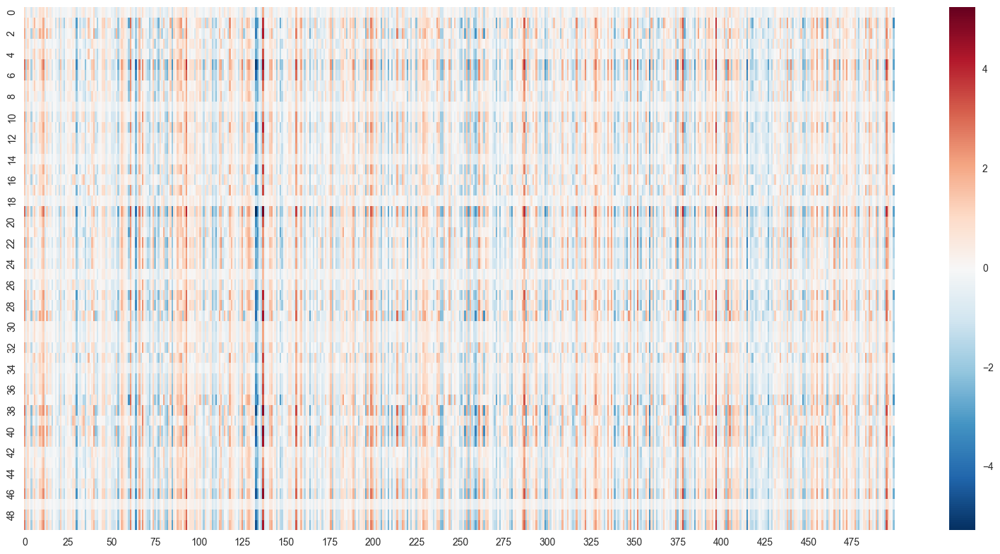

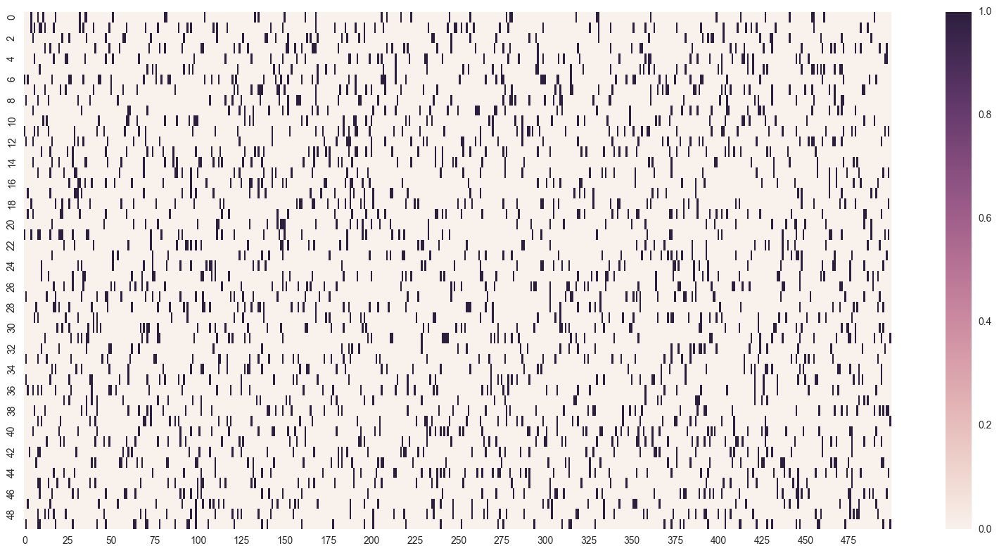

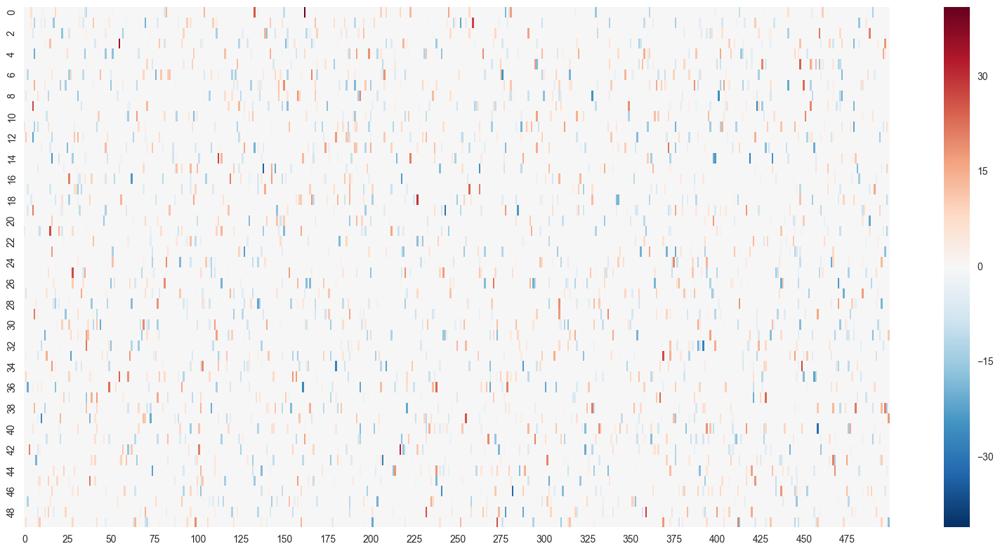

In [4]:
d = 3
m = 50
n = 500
p = .1
G, M_A, L_A, S_A, D_A = get_data_A(d, m, n, p)
plot_3d(G, 'n samples from latent distribution (3D normal)')
plot_heat(L_A, 'Heatmap of n samples from data distribution')
plot_heat(M_A, 'Masking Matrix')
plot_heat(S_A, 'Sparse Matrix')

#### Run denoising algorithm

In [5]:
D_A_den = rpca_denoise(D_A, p_local, p_global)

mu = 0.167696333452
Iteration 0: error=2.997e-02, rank=50, nnz=924, time=8.009e-02
Iteration 1: error=1.591e-03, rank=50, nnz=955, time=1.588e-02
Iteration 2: error=1.005e-03, rank=50, nnz=974, time=1.512e-02
Iteration 3: error=1.031e-03, rank=50, nnz=992, time=1.677e-02
Iteration 4: error=1.114e-03, rank=50, nnz=1011, time=1.106e-02
Iteration 5: error=1.202e-03, rank=50, nnz=1039, time=1.046e-02
Iteration 6: error=1.303e-03, rank=50, nnz=1068, time=1.008e-02
Iteration 7: error=1.407e-03, rank=50, nnz=1103, time=1.061e-02
Iteration 8: error=1.549e-03, rank=50, nnz=1132, time=1.100e-02
Iteration 9: error=1.708e-03, rank=50, nnz=1191, time=1.034e-02
Iteration 10: error=1.910e-03, rank=50, nnz=1240, time=1.563e-02
Iteration 11: error=2.218e-03, rank=50, nnz=1329, time=1.019e-02
Iteration 12: error=2.702e-03, rank=50, nnz=1436, time=1.021e-02
Iteration 13: error=3.275e-03, rank=49, nnz=1549, time=1.036e-02
Iteration 14: error=4.024e-03, rank=47, nnz=1730, time=1.008e-02
Iteration 15: error

#### Qualitative assessment

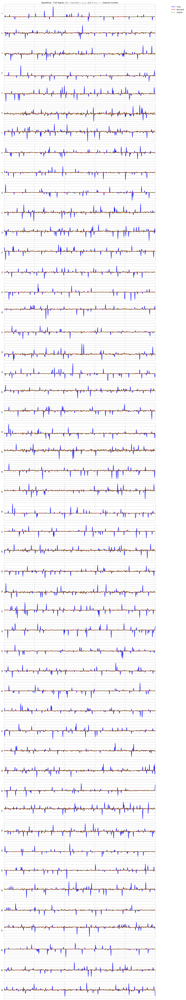

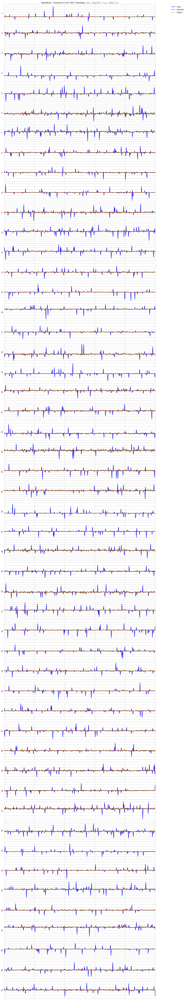

In [6]:
sparklines(L_A, D_A, D_A_den, r'Sparklines - Full Signal, $f(t) = \sin(c 2 \pi t) + \eta$, $\eta \sim \mathcal{G}(0, 0.1 c)$, $c =$ channel number')
plt.show()

sparklines(L_A[:, :1000], D_A[:, :1000], D_A_den[:, :1000],
           'Sparklines - Zoomed In First 1000 Timesteps, $f(t) = \sin(c 2 \pi t) + \eta$, $\eta \sim \mathcal{G}(0, 0.1 c)$')
plt.show()

#### Quantitative assessment

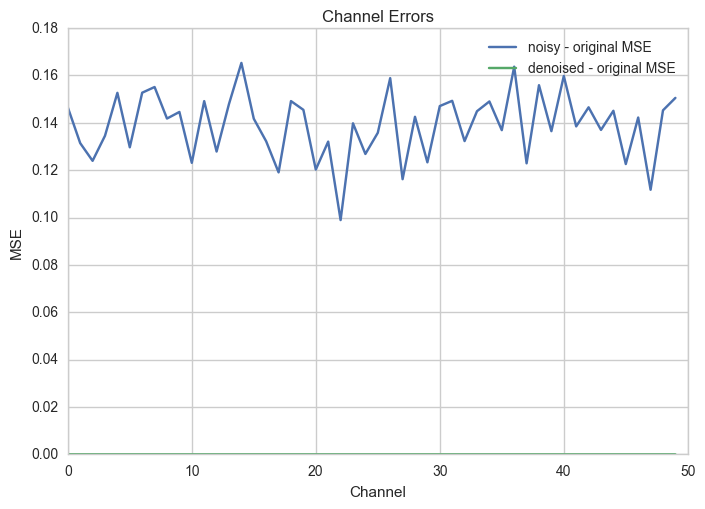

In [7]:
chan_errs(L_A, D_A, D_A_den, 'Channel Errors')
plt.show()

### Bad Simulation : Data does not follow assumptions made
#### Generate data

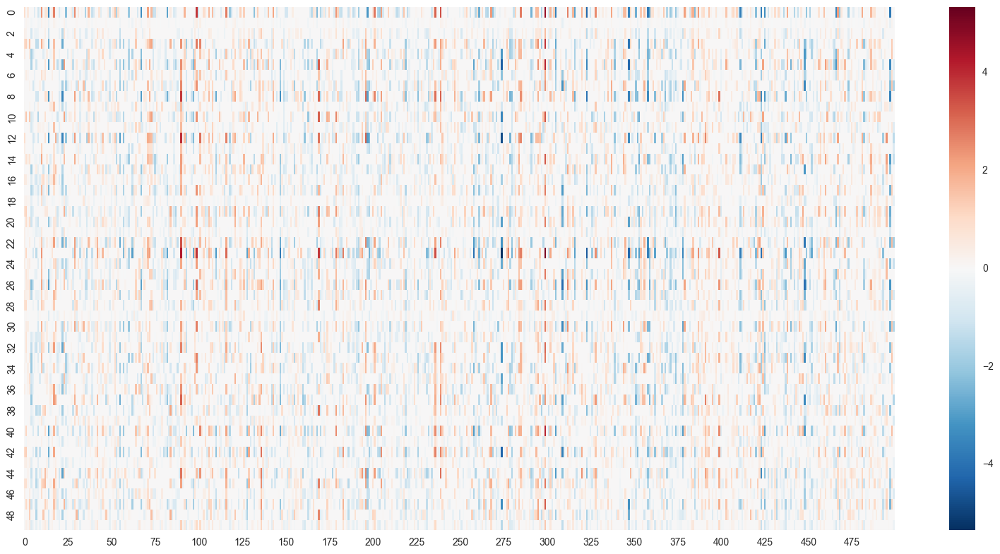

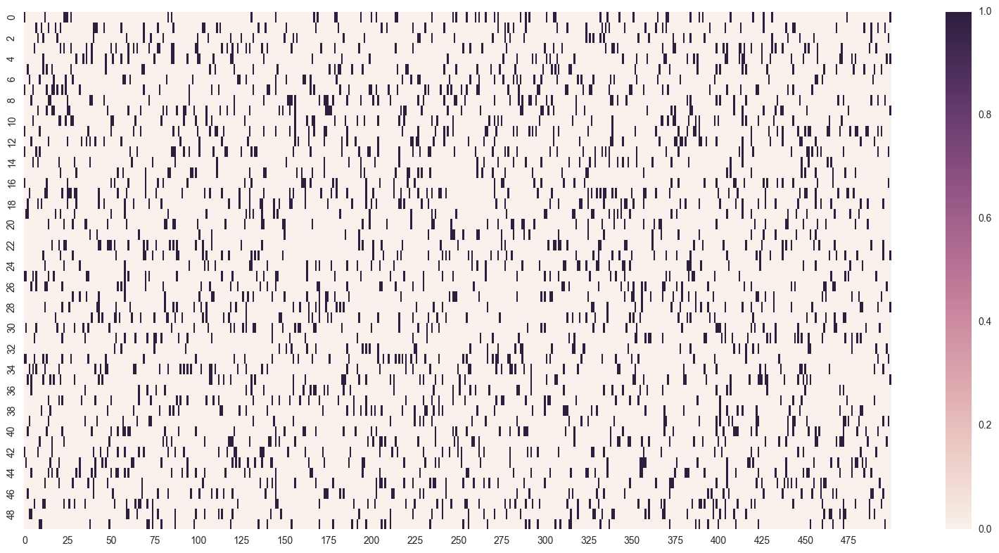

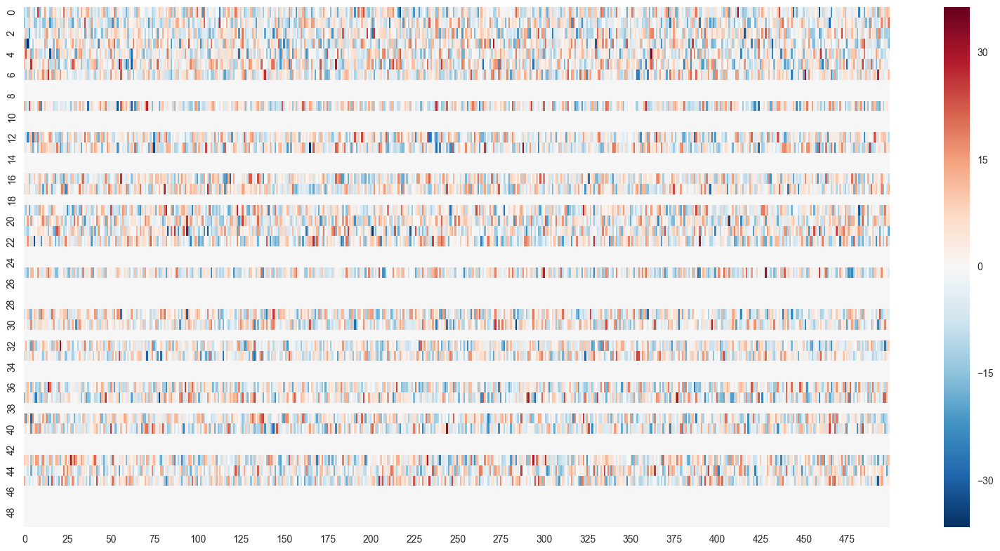

In [23]:
d = 3
m = 50
n = 500
p = .1
G, M_B, L_B, S_B, D_B = get_data_B(d, m, n, p)
plot_3d(G, 'n samples from latent distribution (3D normal)')
plot_heat(L_B, 'Heatmap of n samples from data distribution')
plot_heat(M_B, 'Masking Matrix')
plot_heat(S_B, 'Sparse Matrix')

#### Run Denoising Algorithm

In [24]:
D_B_den = rpca_denoise(D_B, p_local, p_global)

mu = 0.0542578770265
Iteration 0: error=6.972e-02, rank=30, nnz=2697, time=1.111e-02
Iteration 1: error=1.717e-02, rank=36, nnz=3722, time=1.102e-02
Iteration 2: error=9.899e-03, rank=36, nnz=4399, time=1.090e-02
Iteration 3: error=7.272e-03, rank=32, nnz=4852, time=1.267e-02
Iteration 4: error=5.723e-03, rank=31, nnz=5152, time=1.372e-02
Iteration 5: error=4.625e-03, rank=29, nnz=5303, time=1.226e-02
Iteration 6: error=3.770e-03, rank=29, nnz=5353, time=1.153e-02
Iteration 7: error=3.124e-03, rank=28, nnz=5374, time=1.050e-02
Iteration 8: error=2.715e-03, rank=28, nnz=5428, time=1.084e-02
Iteration 9: error=2.288e-03, rank=28, nnz=5542, time=1.043e-02
Iteration 10: error=1.955e-03, rank=28, nnz=5642, time=1.033e-02
Iteration 11: error=1.719e-03, rank=28, nnz=5753, time=1.115e-02
Iteration 12: error=1.530e-03, rank=28, nnz=5880, time=1.122e-02
Iteration 13: error=1.409e-03, rank=29, nnz=5981, time=1.087e-02
Iteration 14: error=1.316e-03, rank=29, nnz=6097, time=1.088e-02
Iteration 15: 

#### Qualitative assessment

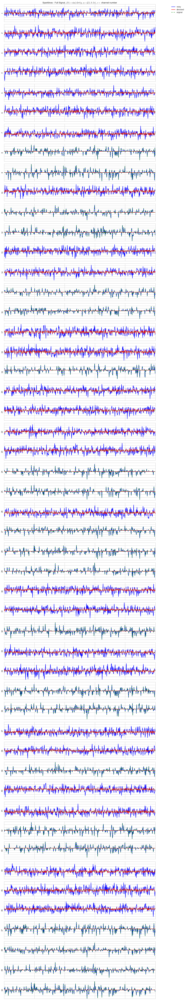

In [25]:
sparklines(L_B, D_B, D_B_den, r'Sparklines - Full Signal, $f(t) = \sin(c 2 \pi t) \eta$, $\eta \sim \mathcal{G}(1, 0.3 c)$, $c =$ channel number')
plt.show()

#### Quantitative assessment

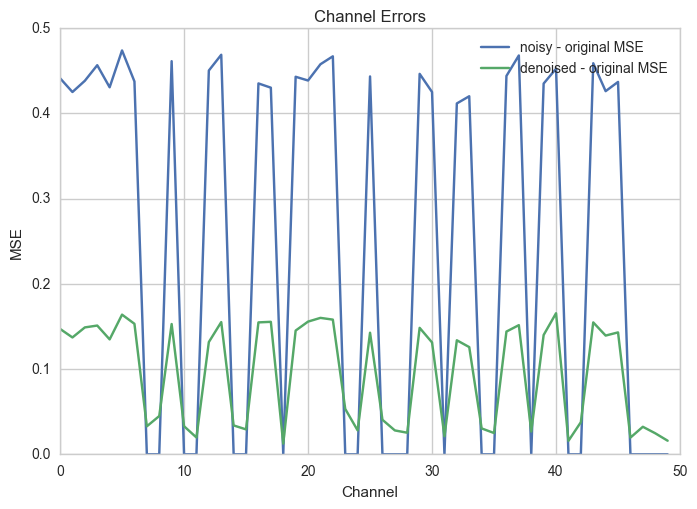

In [26]:
chan_errs(L_B, D_B, D_B_den, 'Channel Errors')
plt.show()

### Real Data
#### Get data

In [34]:
with open('../../../data/sub-0001_trial-01.pkl', 'rb') as f_handle:
    f_real = pkl.load(f_handle)
    f_real = f_real - np.mean(f_real, axis = 1).reshape(-1, 1)
with open('../../../data/sub-0001_trial-01_pre.pkl', 'rb') as f_handle:
    f_pre = pkl.load(f_handle)
    f_pre = f_pre - np.mean(f_pre, axis = 1).reshape(-1, 1)
with open('../../../data/sub-0001_trial-01_bc.pkl', 'rb') as f_handle:
    bc = pkl.load(f_handle)
print f_pre.shape, f_real.shape

(111, 177829) (128, 177829)


#### Run denoising algorithm

In [35]:
method = 'randomized'
max_iter = 50
verbose = True
p_global = {'max_iter': max_iter,
            'verbose': verbose,
            'pca_method': method}
f_real, _ = eog_split(f_real, {}, {})
f_den = rpca_denoise(f_real[::2, ::10], p_local, p_global)

mu = 0.000841679014979
Iteration 0: error=1.474e-02, rank=53, nnz=148038, time=2.857e+00
Iteration 1: error=2.066e-03, rank=55, nnz=186239, time=6.632e-01
Iteration 2: error=1.488e-03, rank=55, nnz=212724, time=6.505e-01
Iteration 3: error=1.313e-03, rank=55, nnz=234972, time=5.291e-01
Iteration 4: error=1.215e-03, rank=53, nnz=253971, time=6.778e-01
Iteration 5: error=1.137e-03, rank=52, nnz=270200, time=7.160e-01
Iteration 6: error=1.068e-03, rank=51, nnz=284389, time=7.086e-01
Iteration 7: error=1.009e-03, rank=49, nnz=296304, time=6.871e-01
Iteration 8: error=9.579e-04, rank=47, nnz=306485, time=7.134e-01
Iteration 9: error=9.116e-04, rank=46, nnz=315074, time=5.030e-01
Iteration 10: error=8.658e-04, rank=44, nnz=322417, time=6.831e-01
Iteration 11: error=8.222e-04, rank=43, nnz=328508, time=6.990e-01
Iteration 12: error=7.761e-04, rank=42, nnz=333693, time=7.145e-01
Iteration 13: error=7.299e-04, rank=41, nnz=337974, time=7.237e-01
Iteration 14: error=6.856e-04, rank=40, nnz=34186

#### Qualitative results

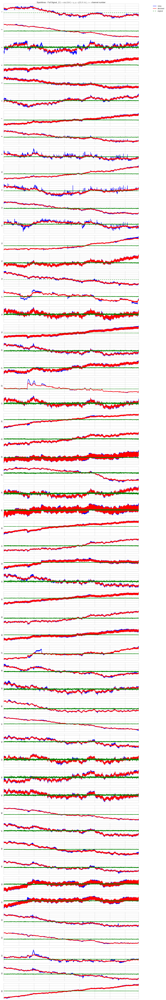

In [36]:
sparklines(f_pre[::2, ::10], f_real[::2, ::10], f_den, r'Sparklines - Full Signal')
plt.show()

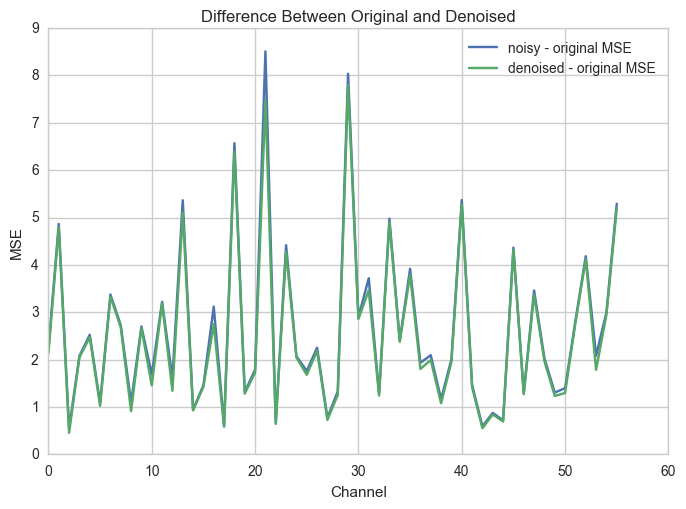

In [38]:
chan_errs(f_pre[::2, ::10], f_real[::2, ::10], f_den, 'Difference Between Original and Denoised')
plt.show()